In [1]:
import torch
import cv2
import matplotlib.pyplot as plt
import os
import torchvision
import numpy as np
from tqdm import tqdm
device = "cuda:1"

# Check Images

In [2]:
path_content = os.getcwd() + "/mirae"
content_numpy = cv2.imread(path_content + "/mirae_1.jpg")

path_style = os.getcwd() + "/arts"
style_numpy_ = cv2.imread(path_style + "/van_gogh.jpg")

print(content_numpy.shape, style_numpy_.shape)

style_numpy = cv2.resize(style_numpy_,  dsize=(534, 371), interpolation = cv2.INTER_LANCZOS4)
print(content_numpy.shape, style_numpy.shape)

(371, 534, 3) (1200, 1920, 3)
(371, 534, 3) (371, 534, 3)


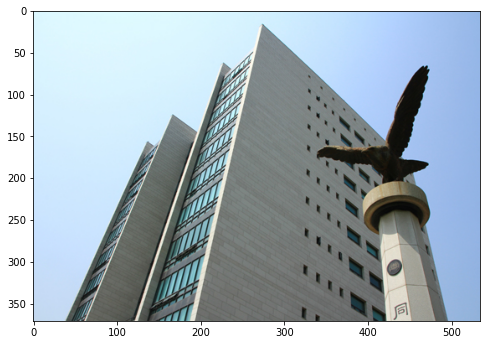

In [3]:
RGB_numpy = cv2.cvtColor(content_numpy, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (8,8))
plt.imshow(RGB_numpy)

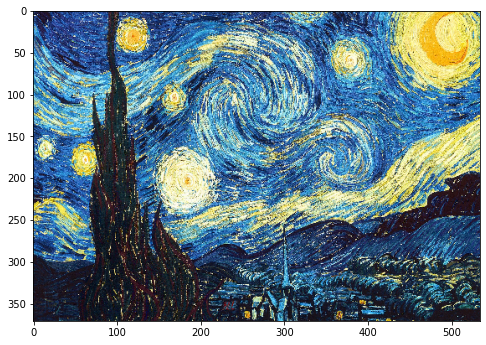

In [4]:
RGB_numpy_ = cv2.cvtColor(style_numpy, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (8,8))
plt.imshow(RGB_numpy_)

(371, 534, 3)


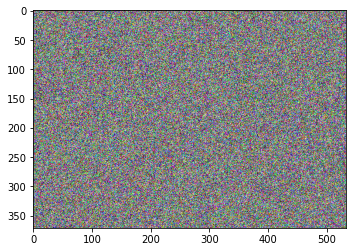

In [5]:
random_numpy = np.random.rand( *(style_numpy.shape) )
print(random_numpy.shape)
plt.imshow(random_numpy)

In [6]:
content_tensor = torchvision.transforms.functional.to_tensor(content_numpy).to(device, torch.float)
style_tensor = torchvision.transforms.functional.to_tensor(style_numpy).to(device, torch.float)
random_tensor = torchvision.transforms.functional.to_tensor(random_numpy).to(device, torch.float)
print(content_tensor.shape, style_tensor.shape, random_tensor.shape)

torch.Size([3, 371, 534]) torch.Size([3, 371, 534]) torch.Size([3, 371, 534])


# Load pre-trained VGG-19  

In [7]:
import torchvision.models as models
from torchsummary import summary
vgg16 = models.vgg16(pretrained=True)
pre_trained = vgg16.features
#summary(pre_trained.to(device), (3, 666, 1000))


In [8]:
print(pre_trained)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

# Make model  

In [9]:
import torch.nn as nn

class feature_extractor(nn.Module):
    def __init__(self):
        super().__init__()

        self.ReLU = nn.ReLU(inplace = True)
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)

        self.c1_1 = nn.Conv2d(in_channels = 3, out_channels = 64, kernel_size = (3,3), stride = (1,1), padding = (1,1), bias = True)
        self.c1_2 = nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size = (3,3), stride = (1,1), padding = (1,1), bias = True)

        self.c2_1 = nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = (3,3), stride = (1,1), padding = (1,1), bias = True)
        self.c2_2 = nn.Conv2d(in_channels = 128, out_channels = 128, kernel_size = (3,3), stride = (1,1), padding = (1,1), bias = True)

        self.c3_1 = nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = (3,3), stride = (1,1), padding = (1,1), bias = True)
        self.c3_2 = nn.Conv2d(in_channels = 256, out_channels = 256, kernel_size = (3,3), stride = (1,1), padding = (1,1), bias = True)
        self.c3_3 = nn.Conv2d(in_channels = 256, out_channels = 256, kernel_size = (3,3), stride = (1,1), padding = (1,1), bias = True)

        self.c4_1 = nn.Conv2d(in_channels = 256, out_channels = 512, kernel_size = (3,3), stride = (1,1), padding = (1,1), bias = True)
        self.c4_2 = nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = (3,3), stride = (1,1), padding = (1,1), bias = True)
        self.c4_3 = nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = (3,3), stride = (1,1), padding = (1,1), bias = True)

        self.c5_1 = nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = (3,3), stride = (1,1), padding = (1,1), bias = True)
        self.c5_2 = nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = (3,3), stride = (1,1), padding = (1,1), bias = True)
        self.c5_3 = nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = (3,3), stride = (1,1), padding = (1,1), bias = True)

    def forward(self, x):

        c1_1 = self.c1_1(x)
        x = self.ReLU(c1_1)
        x = self.c1_2(x)
        x = self.ReLU(x)
        x = self.maxpool(x)

        c2_1 = self.c2_1(x)
        x = self.ReLU(c2_1)
        x = self.c2_2(x)
        x = self.ReLU(x)
        x = self.maxpool(x)

        c3_1 = self.c3_1(x)
        x = self.ReLU(c3_1)
        x = self.c3_2(x)
        x = self.ReLU(x)
        x = self.c3_3(x)
        x = self.ReLU(x)
        x = self.maxpool(x)

        c4_1 = self.c4_1(x)
        x = self.ReLU(c4_1)
        c4_2 = self.c4_2(x)
        x = self.ReLU(c4_2)
        x = self.c4_3(x)
        x = self.ReLU(x)
        x = self.maxpool(x)

        c5_1 = self.c5_1(x)
        x = self.ReLU(c5_1)
        x = self.c5_2(x)
        x = self.ReLU(x)
        x = self.c5_3(x)
        x = self.ReLU(x)
        x = self.maxpool(x)

        return [c1_1, c2_1, c3_1, c4_1, c5_1, c4_2]
        
    

In [10]:
model = feature_extractor().to(device).eval()
outputs = model(content_tensor)
for i in outputs: print(i.shape)



torch.Size([64, 371, 534])
torch.Size([128, 185, 267])
torch.Size([256, 92, 133])
torch.Size([512, 46, 66])
torch.Size([512, 23, 33])
torch.Size([512, 46, 66])


In [11]:
print(len(model.state_dict()), model.state_dict().keys())
print("="*100)
print(len(pre_trained.state_dict()), pre_trained.state_dict().keys())

26 odict_keys(['c1_1.weight', 'c1_1.bias', 'c1_2.weight', 'c1_2.bias', 'c2_1.weight', 'c2_1.bias', 'c2_2.weight', 'c2_2.bias', 'c3_1.weight', 'c3_1.bias', 'c3_2.weight', 'c3_2.bias', 'c3_3.weight', 'c3_3.bias', 'c4_1.weight', 'c4_1.bias', 'c4_2.weight', 'c4_2.bias', 'c4_3.weight', 'c4_3.bias', 'c5_1.weight', 'c5_1.bias', 'c5_2.weight', 'c5_2.bias', 'c5_3.weight', 'c5_3.bias'])
26 odict_keys(['0.weight', '0.bias', '2.weight', '2.bias', '5.weight', '5.bias', '7.weight', '7.bias', '10.weight', '10.bias', '12.weight', '12.bias', '14.weight', '14.bias', '17.weight', '17.bias', '19.weight', '19.bias', '21.weight', '21.bias', '24.weight', '24.bias', '26.weight', '26.bias', '28.weight', '28.bias'])


In [12]:
pre_trained = pre_trained.to(device)

In [13]:
# 한번에 할 수 있을꺼 같은데 내가 설정한 module의 이름과 load한 module의 이름이 달라서 오류나서  
# 위의 방법처럼 직접 바꿔준다.  
# https://discuss.pytorch.org/t/how-to-assign-an-arbitrary-tensor-to-models-parameter/44082/2 를 참고  

state_dict_ = model.state_dict()

# state_dict_을 원하는 parameter로 바꾼뒤 이것을 model에 apply 한다.  

for names, names_ in zip(model.state_dict().keys(), pre_trained.state_dict().keys()):
    state_dict_[names] = pre_trained.state_dict()[names_]

model.load_state_dict(state_dict_)

<All keys matched successfully>

In [14]:
# 그리고 이제 parameter를 freeze하면 된다.  
for param in model.parameters():
    param.requires_grad = False

In [15]:
model = model.to(device)

In [16]:
content_output = model(content_tensor)[-1]
style_output = model(style_tensor)[:-1]
random_output = model(random_tensor)

In [17]:
mse_loss = torch.nn.MSELoss(size_average=None, reduce=None, reduction='mean')

In [18]:
def gram_matrix(feature_map):
    vector_matrix = feature_map.view(feature_map.shape[0], feature_map.shape[1]*feature_map.shape[2])
    gram = torch.mm(vector_matrix, vector_matrix.t())
    return gram


In [19]:
nom = 0.000001

def content_loss(random_output, content_output):
    return mse_loss(random_output, content_output)*(1/2)*nom

def style_loss(random_output_gram, style_output_gram, num_filters):
    return mse_loss(random_output_gram, style_output_gram)*(1/4)*nom

In [20]:
iters = 100000
learning_rate = 1

  0%|          | 0/100000 [00:00<?, ?it/s]

tensor(0.7725, device='cuda:1') tensor(0.0008, device='cuda:1')


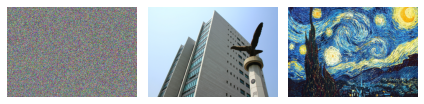

  1%|          | 999/100000 [00:42<1:10:07, 23.53it/s]

tensor(0.9245, device='cuda:1') tensor(-0.0001, device='cuda:1')


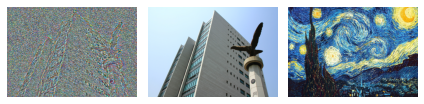

  2%|▏         | 1999/100000 [01:25<1:09:52, 23.37it/s]

tensor(0.9591, device='cuda:1') tensor(0.0004, device='cuda:1')


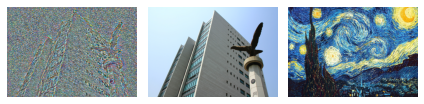

  3%|▎         | 2999/100000 [02:08<1:09:21, 23.31it/s]

tensor(0.9433, device='cuda:1') tensor(-0.0001, device='cuda:1')


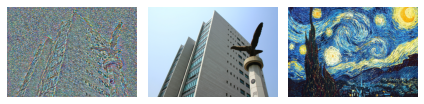

  4%|▍         | 3999/100000 [02:51<1:08:45, 23.27it/s]

tensor(0.9153, device='cuda:1') tensor(4.2821e-05, device='cuda:1')


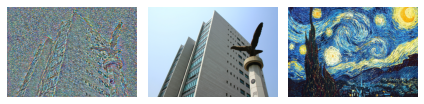

  5%|▍         | 4999/100000 [03:34<1:08:09, 23.23it/s]

tensor(0.9040, device='cuda:1') tensor(-0.0001, device='cuda:1')


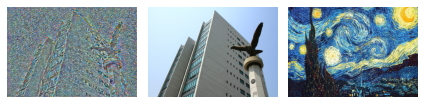

  6%|▌         | 5999/100000 [04:17<1:07:30, 23.21it/s]

tensor(0.9345, device='cuda:1') tensor(-1.0385e-05, device='cuda:1')


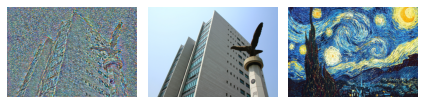

  7%|▋         | 6999/100000 [05:01<1:06:45, 23.22it/s]

tensor(0.9953, device='cuda:1') tensor(-8.1979e-06, device='cuda:1')


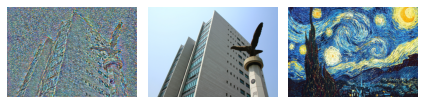

  8%|▊         | 7999/100000 [05:44<1:06:05, 23.20it/s]

tensor(0.9964, device='cuda:1') tensor(-9.8978e-05, device='cuda:1')


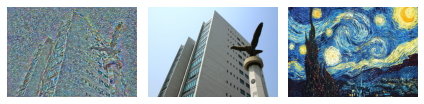

  9%|▉         | 8999/100000 [06:27<1:05:21, 23.21it/s]

tensor(0.9751, device='cuda:1') tensor(-4.0294e-05, device='cuda:1')


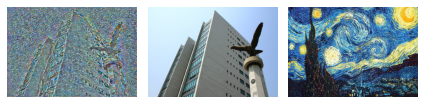

 10%|▉         | 9999/100000 [07:11<1:04:42, 23.18it/s]

tensor(0.9507, device='cuda:1') tensor(0.0001, device='cuda:1')


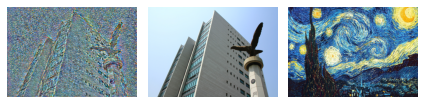

 11%|█         | 10999/100000 [07:54<1:04:02, 23.16it/s]

tensor(0.9380, device='cuda:1') tensor(7.0574e-05, device='cuda:1')


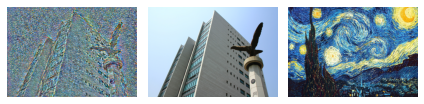

 12%|█▏        | 11999/100000 [08:37<1:03:12, 23.20it/s]

tensor(0.9120, device='cuda:1') tensor(6.7514e-05, device='cuda:1')


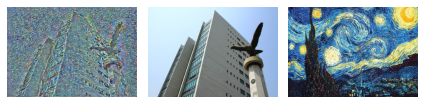

 13%|█▎        | 12999/100000 [09:21<1:02:31, 23.19it/s]

tensor(0.8823, device='cuda:1') tensor(5.4972e-05, device='cuda:1')


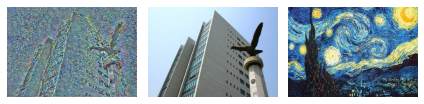

 14%|█▍        | 13999/100000 [10:04<1:01:51, 23.17it/s]

tensor(0.8723, device='cuda:1') tensor(-9.3162e-05, device='cuda:1')


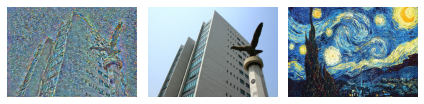

 15%|█▍        | 14999/100000 [10:47<1:01:02, 23.21it/s]

tensor(0.8704, device='cuda:1') tensor(-4.1154e-05, device='cuda:1')


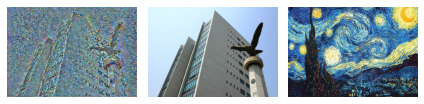

 16%|█▌        | 15999/100000 [11:31<1:00:22, 23.19it/s]

tensor(0.8593, device='cuda:1') tensor(-2.8537e-05, device='cuda:1')


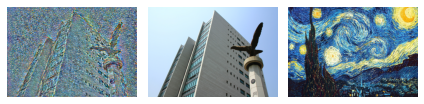

 17%|█▋        | 16999/100000 [12:14<59:41, 23.18it/s]  

tensor(0.8337, device='cuda:1') tensor(1.3436e-05, device='cuda:1')


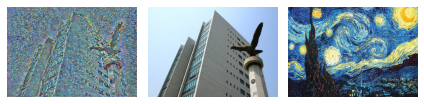

 18%|█▊        | 17999/100000 [12:57<58:50, 23.22it/s]  

tensor(0.8265, device='cuda:1') tensor(-1.0506e-05, device='cuda:1')


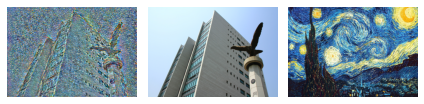

 19%|█▉        | 18999/100000 [13:41<58:11, 23.20it/s]  

tensor(0.8186, device='cuda:1') tensor(0.0001, device='cuda:1')


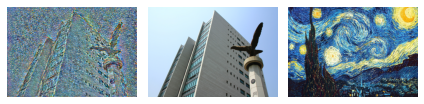

 20%|█▉        | 19999/100000 [14:24<57:29, 23.19it/s]  

tensor(0.8099, device='cuda:1') tensor(-0.0001, device='cuda:1')


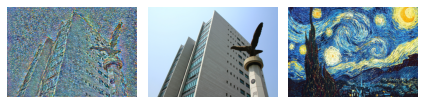

 21%|██        | 20999/100000 [15:07<56:44, 23.21it/s]  

tensor(0.7983, device='cuda:1') tensor(0.0002, device='cuda:1')


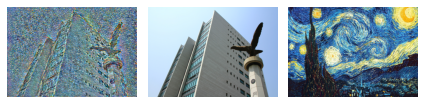

 22%|██▏       | 21999/100000 [15:50<56:04, 23.18it/s]  

tensor(0.7768, device='cuda:1') tensor(-0.0001, device='cuda:1')


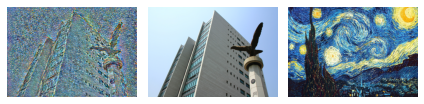

 23%|██▎       | 22999/100000 [16:34<55:21, 23.18it/s]  

tensor(0.7542, device='cuda:1') tensor(0.0002, device='cuda:1')


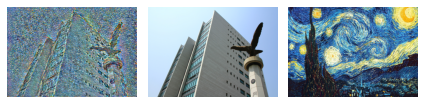

 24%|██▍       | 23999/100000 [17:17<54:37, 23.19it/s]  

tensor(0.7175, device='cuda:1') tensor(4.5114e-05, device='cuda:1')


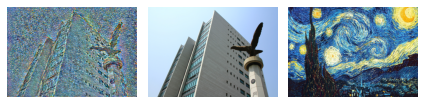

 25%|██▍       | 24999/100000 [18:01<53:56, 23.17it/s]  

tensor(0.6858, device='cuda:1') tensor(8.6659e-05, device='cuda:1')


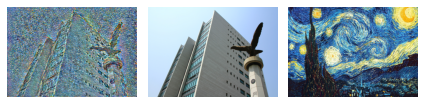

 26%|██▌       | 25999/100000 [18:44<53:15, 23.16it/s]  

tensor(0.6705, device='cuda:1') tensor(7.8528e-05, device='cuda:1')


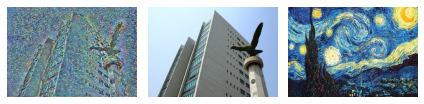

 27%|██▋       | 26999/100000 [19:27<52:30, 23.17it/s]  

tensor(0.6654, device='cuda:1') tensor(6.6139e-05, device='cuda:1')


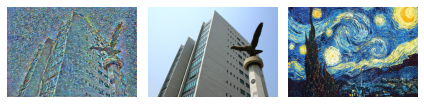

 28%|██▊       | 27999/100000 [20:11<51:45, 23.18it/s]  

tensor(0.6640, device='cuda:1') tensor(-2.5077e-05, device='cuda:1')


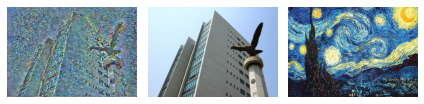

 29%|██▉       | 28999/100000 [20:54<51:01, 23.19it/s]  

tensor(0.6612, device='cuda:1') tensor(7.1795e-05, device='cuda:1')


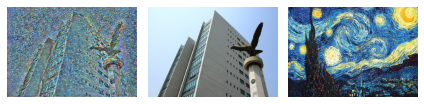

 30%|██▉       | 29999/100000 [21:37<50:18, 23.19it/s]  

tensor(0.6594, device='cuda:1') tensor(-6.6454e-05, device='cuda:1')


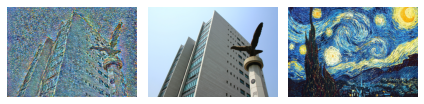

 31%|███       | 30999/100000 [22:21<49:33, 23.21it/s]  

tensor(0.6589, device='cuda:1') tensor(-0.0001, device='cuda:1')


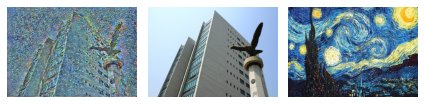

 32%|███▏      | 31999/100000 [23:04<48:51, 23.20it/s]  

tensor(0.6563, device='cuda:1') tensor(-0.0001, device='cuda:1')


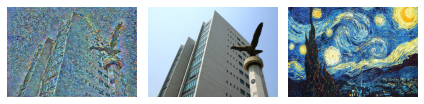

 33%|███▎      | 32999/100000 [23:47<48:09, 23.19it/s]  

tensor(0.6544, device='cuda:1') tensor(2.9620e-05, device='cuda:1')


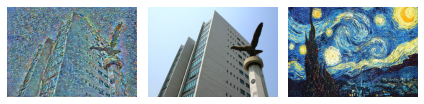

 34%|███▍      | 33999/100000 [24:31<47:26, 23.18it/s]  

tensor(0.6538, device='cuda:1') tensor(-4.6658e-05, device='cuda:1')


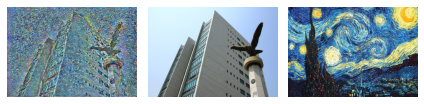

 35%|███▍      | 34999/100000 [25:14<46:44, 23.18it/s]  

tensor(0.6525, device='cuda:1') tensor(-5.9498e-05, device='cuda:1')


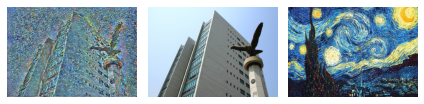

 36%|███▌      | 35999/100000 [25:57<46:01, 23.17it/s]  

tensor(0.6507, device='cuda:1') tensor(-0.0002, device='cuda:1')


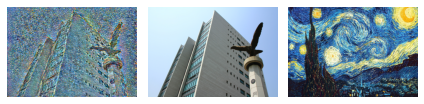

 37%|███▋      | 36999/100000 [26:40<45:17, 23.18it/s]  

tensor(0.6409, device='cuda:1') tensor(-0.0002, device='cuda:1')


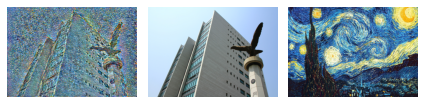

 38%|███▊      | 37999/100000 [27:24<44:35, 23.18it/s]  

tensor(0.6292, device='cuda:1') tensor(-0.0001, device='cuda:1')


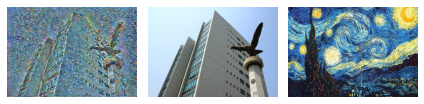

 39%|███▉      | 38999/100000 [28:07<43:51, 23.18it/s]  

tensor(0.6192, device='cuda:1') tensor(-5.8071e-05, device='cuda:1')


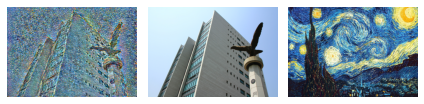

 40%|███▉      | 39999/100000 [28:51<43:09, 23.17it/s]  

tensor(0.6106, device='cuda:1') tensor(-4.2166e-05, device='cuda:1')


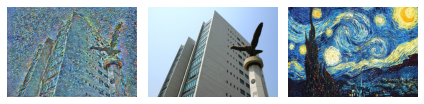

 41%|████      | 40999/100000 [29:34<42:26, 23.17it/s]  

tensor(0.6070, device='cuda:1') tensor(0.0001, device='cuda:1')


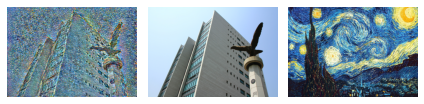

 42%|████▏     | 41999/100000 [30:17<41:41, 23.19it/s]  

tensor(0.6058, device='cuda:1') tensor(-0.0001, device='cuda:1')


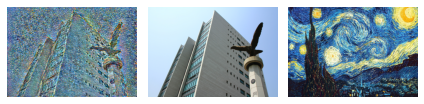

 43%|████▎     | 42999/100000 [31:01<40:57, 23.20it/s]  

tensor(0.6054, device='cuda:1') tensor(0.0001, device='cuda:1')


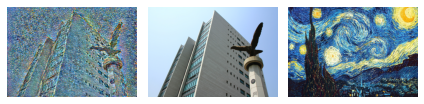

 44%|████▍     | 43999/100000 [31:44<40:15, 23.19it/s]  

tensor(0.6095, device='cuda:1') tensor(-9.2613e-05, device='cuda:1')


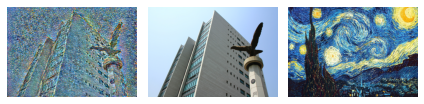

 45%|████▍     | 44999/100000 [32:27<39:30, 23.21it/s]  

tensor(0.6124, device='cuda:1') tensor(1.7791e-05, device='cuda:1')


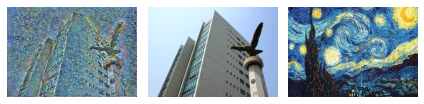

 46%|████▌     | 45999/100000 [33:11<38:45, 23.22it/s]  

tensor(0.6130, device='cuda:1') tensor(-0.0001, device='cuda:1')


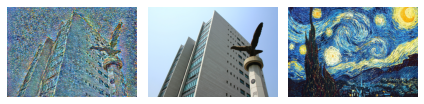

 47%|████▋     | 46999/100000 [33:54<38:02, 23.22it/s]  

tensor(0.6132, device='cuda:1') tensor(-0.0002, device='cuda:1')


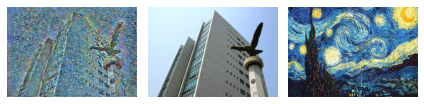

 48%|████▊     | 47999/100000 [34:37<37:22, 23.19it/s]  

tensor(0.6102, device='cuda:1') tensor(0.0001, device='cuda:1')


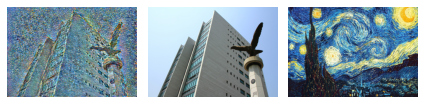

 49%|████▉     | 48999/100000 [35:20<36:39, 23.19it/s]

tensor(0.6082, device='cuda:1') tensor(-0.0001, device='cuda:1')


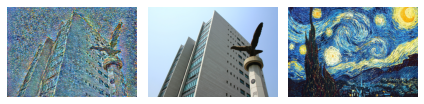

 50%|████▉     | 49999/100000 [36:04<35:56, 23.19it/s]

tensor(0.6088, device='cuda:1') tensor(-2.7893e-05, device='cuda:1')


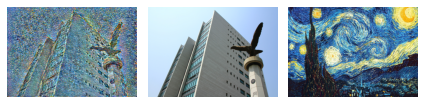

 51%|█████     | 50999/100000 [36:47<35:16, 23.16it/s]

tensor(0.6056, device='cuda:1') tensor(9.8579e-05, device='cuda:1')


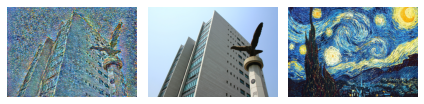

 52%|█████▏    | 51999/100000 [37:31<34:30, 23.19it/s]  

tensor(0.6029, device='cuda:1') tensor(-3.7317e-05, device='cuda:1')


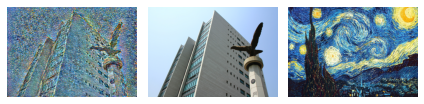

 53%|█████▎    | 52999/100000 [38:14<33:49, 23.16it/s]

tensor(0.6028, device='cuda:1') tensor(0.0001, device='cuda:1')


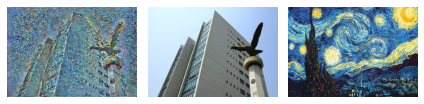

 54%|█████▍    | 53999/100000 [38:57<33:03, 23.20it/s]

tensor(0.6006, device='cuda:1') tensor(9.9290e-05, device='cuda:1')


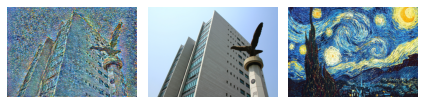

 55%|█████▍    | 54999/100000 [39:41<32:20, 23.19it/s]

tensor(0.5989, device='cuda:1') tensor(-4.0724e-05, device='cuda:1')


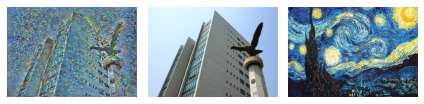

 56%|█████▌    | 55999/100000 [40:24<31:38, 23.18it/s]

tensor(0.6018, device='cuda:1') tensor(-5.9715e-05, device='cuda:1')


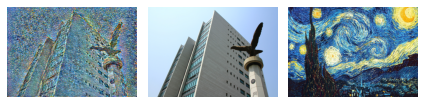

 57%|█████▋    | 56999/100000 [41:07<30:52, 23.21it/s]

tensor(0.6025, device='cuda:1') tensor(-2.1141e-05, device='cuda:1')


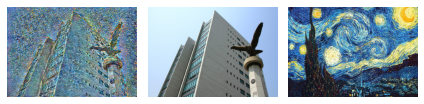

 58%|█████▊    | 57999/100000 [41:50<30:10, 23.20it/s]

tensor(0.6030, device='cuda:1') tensor(5.9394e-05, device='cuda:1')


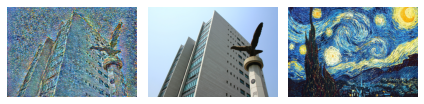

 59%|█████▉    | 58999/100000 [42:34<29:26, 23.20it/s]

tensor(0.6058, device='cuda:1') tensor(0.0001, device='cuda:1')


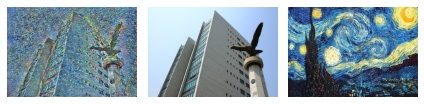

 60%|█████▉    | 59999/100000 [43:17<28:45, 23.19it/s]

tensor(0.6095, device='cuda:1') tensor(-0.0001, device='cuda:1')


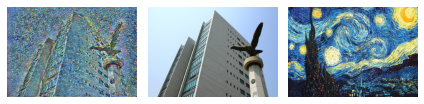

 61%|██████    | 60999/100000 [44:01<28:03, 23.17it/s]

tensor(0.6079, device='cuda:1') tensor(5.0851e-05, device='cuda:1')


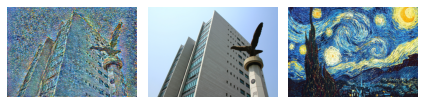

 62%|██████▏   | 61999/100000 [44:44<27:21, 23.15it/s]

tensor(0.6027, device='cuda:1') tensor(0.0003, device='cuda:1')


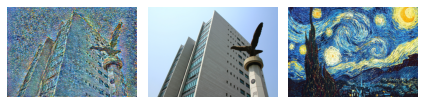

 63%|██████▎   | 62999/100000 [45:27<26:37, 23.17it/s]

tensor(0.5976, device='cuda:1') tensor(0.0002, device='cuda:1')


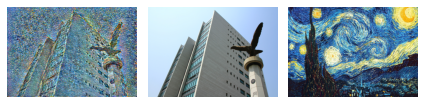

 64%|██████▍   | 63999/100000 [46:11<25:54, 23.15it/s]

tensor(0.5973, device='cuda:1') tensor(0.0003, device='cuda:1')


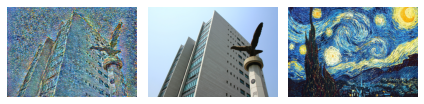

 65%|██████▍   | 64999/100000 [46:54<25:10, 23.17it/s]

tensor(0.5989, device='cuda:1') tensor(-7.7607e-05, device='cuda:1')


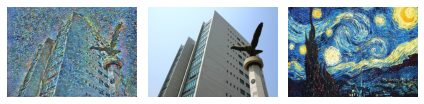

 66%|██████▌   | 65999/100000 [47:37<24:26, 23.19it/s]

tensor(0.6022, device='cuda:1') tensor(-0.0001, device='cuda:1')


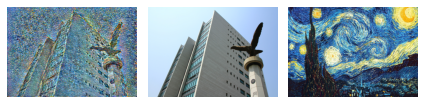

 67%|██████▋   | 66999/100000 [48:21<23:43, 23.19it/s]

tensor(0.6138, device='cuda:1') tensor(5.4048e-05, device='cuda:1')


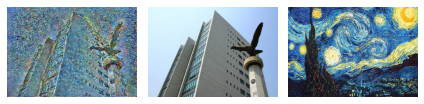

 68%|██████▊   | 67999/100000 [49:04<23:00, 23.17it/s]

tensor(0.6248, device='cuda:1') tensor(-0.0003, device='cuda:1')


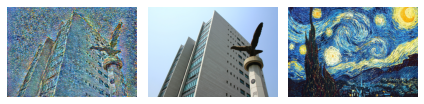

 69%|██████▉   | 68999/100000 [49:47<22:15, 23.21it/s]

tensor(0.6315, device='cuda:1') tensor(0.0001, device='cuda:1')


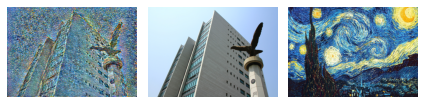

 70%|██████▉   | 69999/100000 [50:31<21:33, 23.20it/s]

tensor(0.6416, device='cuda:1') tensor(5.5528e-05, device='cuda:1')


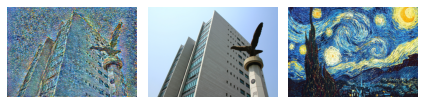

 71%|███████   | 70999/100000 [51:14<20:49, 23.21it/s]

tensor(0.6503, device='cuda:1') tensor(-0.0001, device='cuda:1')


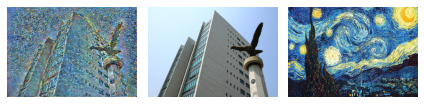

 72%|███████▏  | 71999/100000 [51:57<20:07, 23.20it/s]

tensor(0.6576, device='cuda:1') tensor(-0.0002, device='cuda:1')


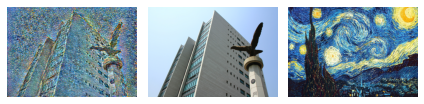

 73%|███████▎  | 72999/100000 [52:41<19:25, 23.16it/s]

tensor(0.6647, device='cuda:1') tensor(-1.3281e-05, device='cuda:1')


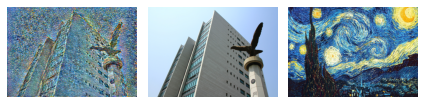

 74%|███████▍  | 73999/100000 [53:24<18:42, 23.16it/s]

tensor(0.6716, device='cuda:1') tensor(-3.8152e-05, device='cuda:1')


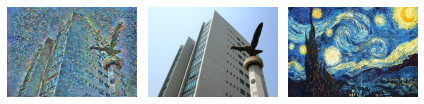

 75%|███████▍  | 74999/100000 [54:07<18:00, 23.14it/s]

tensor(0.6775, device='cuda:1') tensor(-0.0001, device='cuda:1')


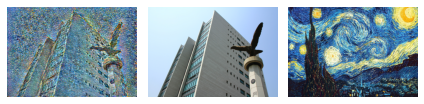

 76%|███████▌  | 75999/100000 [54:51<17:15, 23.19it/s]

tensor(0.6829, device='cuda:1') tensor(0.0002, device='cuda:1')


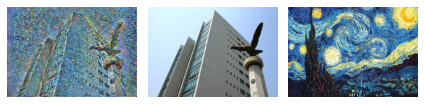

 77%|███████▋  | 76999/100000 [55:34<16:32, 23.17it/s]

tensor(0.6878, device='cuda:1') tensor(0.0001, device='cuda:1')


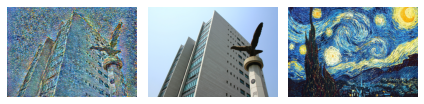

 78%|███████▊  | 77999/100000 [56:17<15:49, 23.18it/s]

tensor(0.6906, device='cuda:1') tensor(2.0143e-05, device='cuda:1')


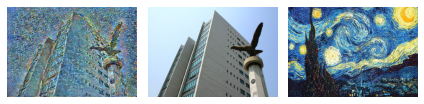

 79%|███████▉  | 78999/100000 [57:01<15:04, 23.21it/s]

tensor(0.6928, device='cuda:1') tensor(-0.0001, device='cuda:1')


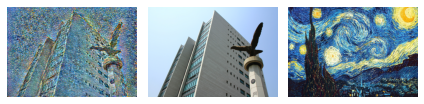

 80%|███████▉  | 79999/100000 [57:44<14:22, 23.19it/s]

tensor(0.6942, device='cuda:1') tensor(5.6608e-05, device='cuda:1')


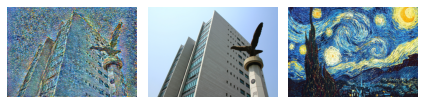

 81%|████████  | 80999/100000 [58:27<13:39, 23.19it/s]

tensor(0.6957, device='cuda:1') tensor(-0.0002, device='cuda:1')


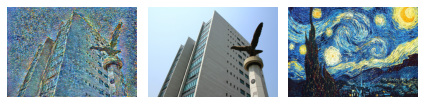

 82%|████████▏ | 81999/100000 [59:11<12:55, 23.21it/s]

tensor(0.6979, device='cuda:1') tensor(-0.0002, device='cuda:1')


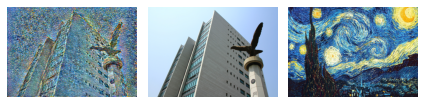

 83%|████████▎ | 82999/100000 [59:54<12:12, 23.22it/s]

tensor(0.6997, device='cuda:1') tensor(0.0002, device='cuda:1')


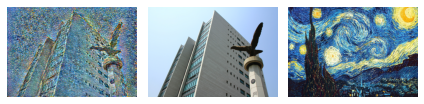

 84%|████████▍ | 83999/100000 [1:00:37<11:30, 23.19it/s]

tensor(0.7018, device='cuda:1') tensor(0.0002, device='cuda:1')


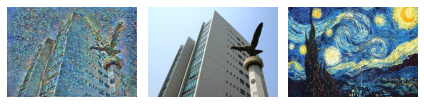

 85%|████████▍ | 84999/100000 [1:01:21<10:46, 23.20it/s]

tensor(0.7042, device='cuda:1') tensor(-0.0003, device='cuda:1')


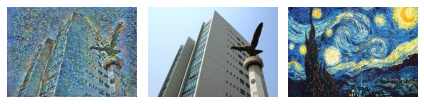

 86%|████████▌ | 85999/100000 [1:02:04<10:03, 23.19it/s]

tensor(0.7072, device='cuda:1') tensor(5.8365e-05, device='cuda:1')


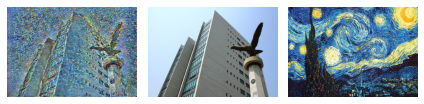

 87%|████████▋ | 86999/100000 [1:02:47<09:20, 23.19it/s]

tensor(0.7091, device='cuda:1') tensor(0.0004, device='cuda:1')


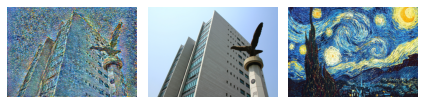

 88%|████████▊ | 87999/100000 [1:03:31<08:38, 23.16it/s]

tensor(0.7104, device='cuda:1') tensor(0.0003, device='cuda:1')


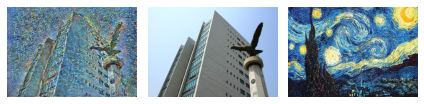

 89%|████████▉ | 88999/100000 [1:04:14<07:54, 23.20it/s]

tensor(0.7124, device='cuda:1') tensor(0.0003, device='cuda:1')


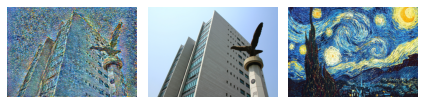

 90%|████████▉ | 89999/100000 [1:04:57<07:11, 23.16it/s]

tensor(0.7141, device='cuda:1') tensor(1.5311e-05, device='cuda:1')


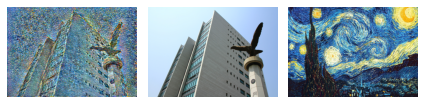

 91%|█████████ | 90999/100000 [1:05:41<06:28, 23.16it/s]

tensor(0.7161, device='cuda:1') tensor(7.9370e-05, device='cuda:1')


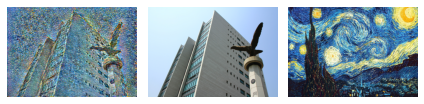

 92%|█████████▏| 91999/100000 [1:06:24<05:44, 23.19it/s]

tensor(0.7186, device='cuda:1') tensor(0.0002, device='cuda:1')


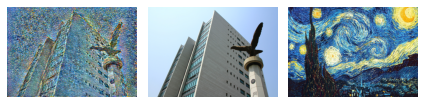

 93%|█████████▎| 92999/100000 [1:07:07<05:01, 23.19it/s]

tensor(0.7201, device='cuda:1') tensor(6.9429e-05, device='cuda:1')


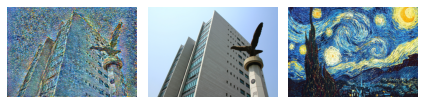

 94%|█████████▍| 93999/100000 [1:07:51<04:18, 23.21it/s]

tensor(0.7230, device='cuda:1') tensor(5.5851e-05, device='cuda:1')


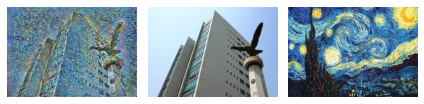

 95%|█████████▍| 94999/100000 [1:08:34<03:35, 23.21it/s]

tensor(0.7262, device='cuda:1') tensor(-0.0002, device='cuda:1')


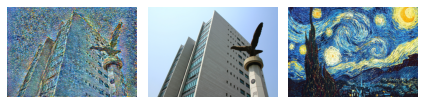

 96%|█████████▌| 95999/100000 [1:09:17<02:52, 23.22it/s]

tensor(0.7295, device='cuda:1') tensor(4.5933e-05, device='cuda:1')


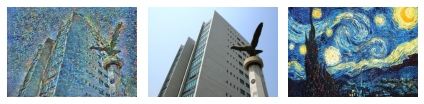

 97%|█████████▋| 96999/100000 [1:10:01<02:09, 23.18it/s]

tensor(0.7331, device='cuda:1') tensor(9.0614e-05, device='cuda:1')


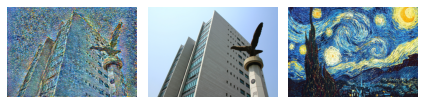

 98%|█████████▊| 97999/100000 [1:10:44<01:26, 23.18it/s]

tensor(0.7352, device='cuda:1') tensor(-3.6148e-06, device='cuda:1')


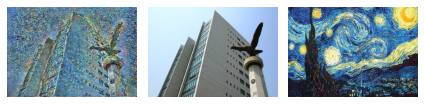

 99%|█████████▉| 98999/100000 [1:11:27<00:43, 23.17it/s]

tensor(0.7381, device='cuda:1') tensor(0.0001, device='cuda:1')


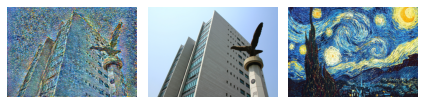

100%|██████████| 100000/100000 [1:12:11<00:00, 23.09it/s]


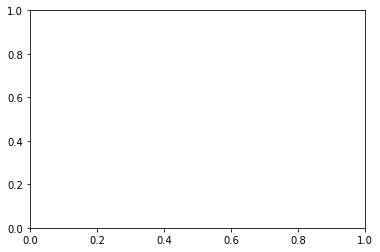

In [21]:
for i in tqdm(range(iters)):

    random_tensor.requires_grad = True

    total_loss = 0

    content_output = model(content_tensor)[-1]
    style_output = model(style_tensor)[:-1]
    random_output = model(random_tensor)

    loss_value_content = content_loss(random_output[-1], content_output)
    loss_value_style = 0

    for style, random in zip(style_output, random_output[:-1]):
        random_output_gram = gram_matrix(random)
        style_output_gram = gram_matrix(style)
        loss_value_style += style_loss(random_output_gram, style_output_gram, style_output_gram.shape[0])

    total_loss =  100000000*loss_value_content + 0.1*loss_value_style

    total_loss.backward()
    gradients = learning_rate * random_tensor.grad
    random_tensor = torch.clamp(random_tensor - gradients, min=0, max=1).detach()   # 아래꺼 계산하기 위해 detach()
    
    if i % 1000 == 0:
        print(random_tensor[0][0][0], gradients[0][0][0])
        output_numpy_ = np.array(random_tensor.detach().cpu().squeeze(0))
        output_image_ = output_numpy_.transpose(1,2,0)
        cv2.imwrite(f"./results/3/{i}.png" ,output_image_* 255.0)
        plt.subplot(1,3,1)
        plt.imshow(cv2.cvtColor(output_image_, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.subplot(1,3,2)
        plt.imshow(RGB_numpy)
        plt.axis('off')
        plt.subplot(1,3,3)
        plt.imshow(RGB_numpy_)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
        plt.cla()

In [22]:
image_list = os.listdir("./results/2_2")
len(image_list)

1

1it [00:01,  1.21s/it]


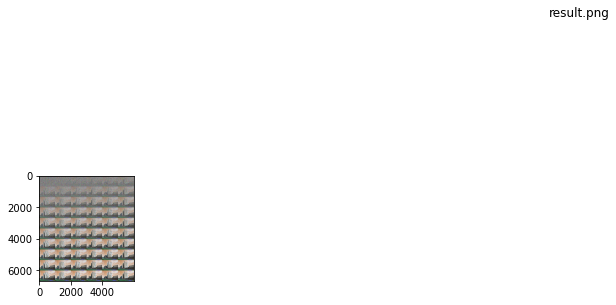

In [23]:
a = 1
plt.figure(figsize = (20,20))
for n,i in tqdm(enumerate(image_list)):
    image = cv2.imread("./results/2_2/" + i)
    plt.subplot(6,10,n+1)
    #plt.tight_layout()
    #plt.axis('off')
    plt.suptitle(i)
    plt.imshow(image)
plt.show()

    


In [24]:
image = cv2.imread("./results/2_2/" + image_list[0])
image.shape

(6660, 6000, 3)

In [25]:
big_image = np.zeros([ image.shape[0]*10, image.shape[1]*6, 3 ])
big_image.shape

(66600, 36000, 3)

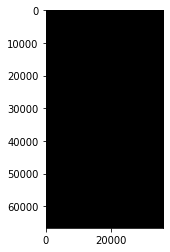

In [26]:
plt.imshow(big_image)

In [27]:
image.shape, big_image.shape

((6660, 6000, 3), (66600, 36000, 3))

In [28]:
w = 0
h = 0
for i in tqdm(image_list):
    image = cv2.imread("./results/2_2/" + i)
    big_image[0 + 666*h : 666 + 666*h, 0 + 1000*w : 1000 + 1000*w, :] = image
    
    w += 1
    if w == 6:
        w = 0
        h += 1

  0%|          | 0/1 [00:00<?, ?it/s]


ValueError: could not broadcast input array from shape (6660,6000,3) into shape (666,1000,3)

In [ ]:
plt.figure(figsize = (20,20))
plt.imshow(big_image.astype('uint8'))
plt.axis('off')
cv2.imwrite("./results/2_2/result.png", cv2.cvtColor(big_image.astype('uint8'), cv2.COLOR_BGR2RGB))